## Importing Packages

In [2]:
# Import packages from Python standard library
import numpy as np
import pandas as pd
import re
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt

## Loading Datasets

### Considering all Branches (open and closed)

- It is assumed that when values of 0 are displayed for the branch metrics (visitors, computer sessions, circulation), it is because the branch was closed during a certain time period.
- Also, there are certain branch metric values that display as NaN. So, when we are considering all branches, we can make the NaN values equal to 0. We do this to prevent later issues when taking percentages or ratios.

In [3]:
#Reading in the Branch Metrics dataset
all_branches = pd.read_csv('../../data/clean/branch_metrics.csv')

#Fill NaN values in Computer Sessions column and Visitors column with zeros
all_branches['COMPUTER_SESSIONS'] = all_branches['COMPUTER_SESSIONS'].fillna(0)
all_branches['VISITORS'] = all_branches['VISITORS'].fillna(0)

In [4]:
all_branches

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
0,Albany Park,2011,1,8427.0,1666.0,9604.0
1,Albany Park,2011,2,7023.0,1296.0,10500.0
2,Albany Park,2011,3,9702.0,1735.0,9050.0
3,Albany Park,2011,4,9344.0,1841.0,9300.0
4,Albany Park,2011,5,8865.0,1683.0,8271.0
...,...,...,...,...,...,...
11875,Wrightwood-Ashburn,2022,12,575.0,511.0,1410.0
11876,Wrightwood-Ashburn,2023,1,658.0,577.0,1625.0
11877,Wrightwood-Ashburn,2023,2,683.0,561.0,12146.0
11878,Wrightwood-Ashburn,2023,3,834.0,806.0,6312.0


In [7]:
test3 = all_branches.loc[(all_branches['COMPUTER_SESSIONS'] == 0)]
year2019test = test3.groupby(['YEAR','BRANCH']).sum()
year2019test.loc[[2019]]
#year2019test.loc['YEAR','MONTH']

MONTH  CIRCULATION  COMPUTER_SESSIONS  VISITORS
YEAR BRANCH                                                              
2019 Coleman                  9         26.0                0.0       0.0
     Douglass                55          6.0                0.0       0.0
     Galewood-Mont Clare     78       9156.0                0.0   20463.0
     Jefferson Park          54        103.0                0.0       0.0
     Legler Regional         23          0.0                0.0       0.0
     Merlo                   75          1.0                0.0       0.0
     Northtown                2         45.0                0.0       0.0
     Portage-Cragin           5          0.0                0.0       0.0
     South Shore             72          1.0                0.0       0.0
     Walker                  11         54.0                0.0       0.0

In [14]:
test2 = all_branches.loc[((all_branches['BRANCH']) == 'Woodson Regional') & ((all_branches['YEAR'] == 2017))]
test2

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
11656,Woodson Regional,2017,1,0.0,0.0,0.0
11657,Woodson Regional,2017,2,0.0,0.0,0.0
11658,Woodson Regional,2017,3,0.0,0.0,0.0
11659,Woodson Regional,2017,4,0.0,0.0,0.0
11660,Woodson Regional,2017,5,0.0,0.0,0.0
11661,Woodson Regional,2017,6,0.0,0.0,0.0
11662,Woodson Regional,2017,7,0.0,0.0,0.0
11663,Woodson Regional,2017,8,0.0,0.0,0.0
11664,Woodson Regional,2017,9,0.0,0.0,0.0
11665,Woodson Regional,2017,10,0.0,0.0,0.0


### Considering only Open Branches

- Since we assume that the branch metrics (visitors, computer sessions, circulation) that have values of 0 represent closures, we also decided to include a dataset where these values of 0 don't exist. We decided to do this in cases of when we take a percentage or ratio, so that we won't have a 0 in the demoninator. 

In [3]:
#Creating a dataset that excludes rows where Computer Sessions and Visitors both equal 0
open_branches = all_branches[(all_branches['VISITORS'] > 0) & (all_branches['COMPUTER_SESSIONS'] > 0)]

In [17]:
test = open_branches.loc[((open_branches['BRANCH']) == 'Woodson Regional') & ((open_branches['YEAR'] == 2018))]
test

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
11669,Woodson Regional,2018,2,2802.0,1884.0,10425.0
11670,Woodson Regional,2018,3,6314.0,5522.0,17158.0
11671,Woodson Regional,2018,4,5892.0,5784.0,21171.0
11672,Woodson Regional,2018,5,5110.0,5388.0,15710.0
11673,Woodson Regional,2018,6,5108.0,5972.0,14644.0
11674,Woodson Regional,2018,7,5609.0,6993.0,15296.0
11675,Woodson Regional,2018,8,5335.0,6718.0,20358.0
11676,Woodson Regional,2018,9,5902.0,7469.0,17793.0
11677,Woodson Regional,2018,10,6386.0,8532.0,23617.0
11678,Woodson Regional,2018,11,5421.0,7407.0,18460.0


In [7]:
# Calculate the sum of Computer Sessions and sum of Visitors from all years
branch_metrics = branches.groupby('BRANCH').agg({'COMPUTER_SESSIONS': 'sum', 'VISITORS': 'sum'})

# Adding a column that calculates the Computer Session Percentage (computer sessions/visitors)*100
branch_metrics['COMPUTER_SESSION_PERCENTAGE'] = (branch_metrics['COMPUTER_SESSIONS'] / branch_metrics['VISITORS']) * 100

# Sort percentages of Computer Sessions from greatest to least
branch_metrics_sorted = branch_metrics.sort_values('COMPUTER_SESSION_PERCENTAGE', ascending=False)

# Plot 
plt.figure(figsize=(12, 6))
plt.barh(branch_metrics_sorted.index, branch_metrics_sorted['COMPUTER_SESSION_PERCENTAGE'])
plt.xlabel('Percentage of Computer Sessions over Visitors')
plt.ylabel('Branch')
plt.title('Comparison of Percentage of Computer Sessions over Visitors for Each Branch from 2011-2023')
plt.xticks(rotation=85)
plt.grid(True)
plt.show()

NameError: name 'branches' is not defined

Explanation For Above Graph:
- This graph sums up all of the Computer Sessions and sums up the Visitors from each branch for all years.
- Then, it creates a new column that displays the values when dividing (sum of Computer Sessions/sum of Visitors)*100 and sorts them from greatest to least

In [5]:
# Calculate the sum of Computer Sessions and sum of Visitors from all years
branch_metrics2 = branches_nonzero.groupby('BRANCH').agg({'COMPUTER_SESSIONS': 'sum', 'VISITORS': 'sum'})

# Adding a column that calculates the Computer Session Percentage (computer sessions/visitors)*100
branch_metrics2['COMPUTER_SESSION_PERCENTAGE'] = (branch_metrics2['COMPUTER_SESSIONS'] / branch_metrics2['VISITORS'])* 100

# Sort percentages of Computer Sessions from greatest to least
branch_metrics_sorted = branch_metrics2.sort_values('COMPUTER_SESSION_PERCENTAGE', ascending=False)

# Plot 
plt.figure(figsize=(12, 6))
plt.barh(branch_metrics_sorted.index, branch_metrics_sorted['COMPUTER_SESSION_PERCENTAGE'])
plt.xlabel('Percentage of Computer Sessions over Visitors')
plt.ylabel('Branch')
plt.title('Comparison of Percentage of Computer Sessions over Visitors for Each Branch from 2011-2023')
plt.xticks(rotation=85)
plt.grid(True)
plt.show()

NameError: name 'branches_nonzero' is not defined

**When comparing these two graphs, the graph that 

## Exploratory Analysis: Calculating ratio of Computer Sessions per Visitor (yearly)

***The rest of my graphs in this notebook involve calcualting the ratio of Computer Sessions per Visitor. Thus, I will use the only_open_branches Dataset, as this excludes values of 0.***

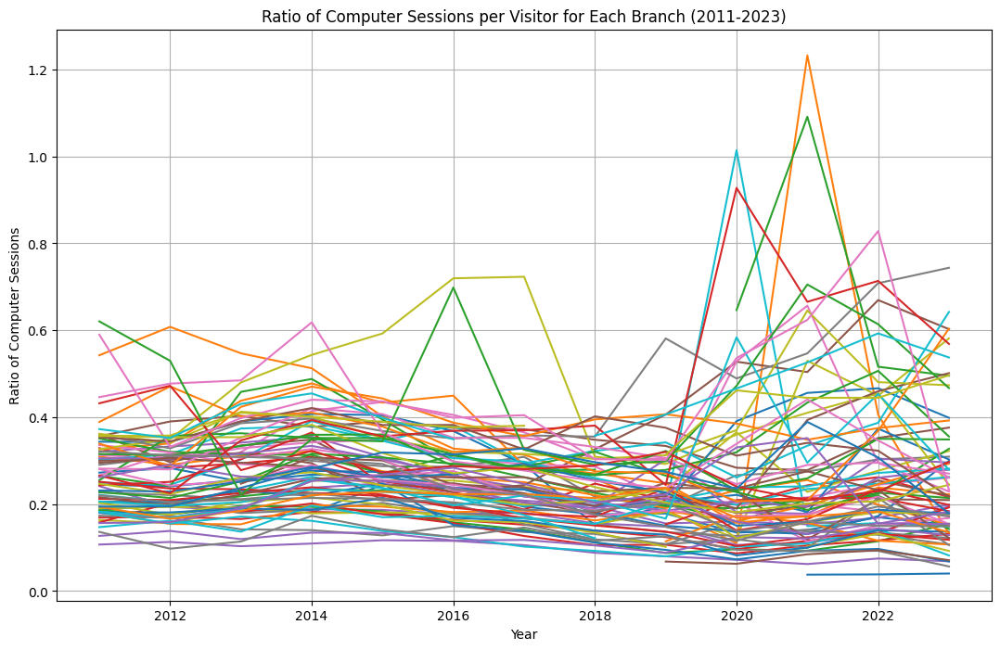

In [4]:
#Copying the Dataset only_open_branches to make a new Dataset open_branches_cspv that I can add a ratio of "Computer Sessions per Visitor" column
open_branches_cspv = open_branches.copy()

#Calculating the ratio of Computer Sessions per Visitor, and creating a new column with these ratios
open_branches_cspv['COMPUTER_SESSIONS_PERCENTAGE'] = (open_branches['COMPUTER_SESSIONS'] / open_branches['VISITORS'])

#Create a Dataset that extracts all 81 branches from open_branches_cspv, averages all of the monthly ratios into one ratio for each year (2011-2023). This process is done for every branch.
#This is then graphed.
open_branches_cspv_yearly = open_branches_cspv.groupby(['BRANCH', 'YEAR'])['COMPUTER_SESSIONS_PERCENTAGE'].mean().unstack()
plt.figure(figsize=(13, 8))
for branch in open_branches_cspv_yearly.index:
    plt.plot(open_branches_cspv_yearly.columns, open_branches_cspv_yearly.loc[branch], label=branch)
plt.xlabel('Year')
plt.ylabel('Ratio of Computer Sessions')
plt.title('Ratio of Computer Sessions per Visitor for Each Branch (2011-2023)')
#plt.legend()  #Because there are 81 branches, I commented the legend out, as it is a very long list of branch names
plt.grid(True)
plt.show()

After determining which library branches were the spikes in the above graph, I then chose to compare those indiviudal branches with the average of all of the branches in the above graph. Thus, I am taking all 81 yearly averages for each branch, and creating a line called avg_all_branches that averages those into one ratio for each year.

#### Looking at Altgeld:

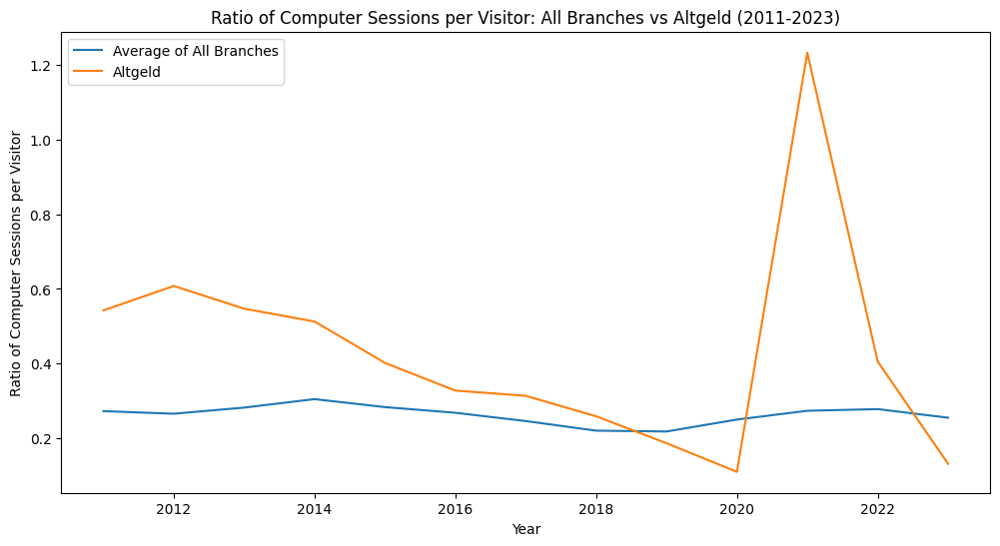

In [6]:
#Selected branch
branch_name = 'Altgeld'

#Average of all 81 yearly average values
avg_all_branches = open_branches_cspv_yearly.mean(axis=0)
avg_all_branches

#Extracting specific branch
selected_branch = open_branches_cspv_yearly.loc[branch_name]

plt.figure(figsize=(12,6))
plt.plot(avg_all_branches, label='Average of All Branches')
plt.plot(selected_branch, label=branch_name)
plt.xlabel('Year')
plt.ylabel('Ratio of Computer Sessions per Visitor')
plt.title(f'Ratio of Computer Sessions per Visitor: All Branches vs {branch_name} (2011-2023)')
plt.legend()
plt.show()

*Note that the highest point in the line is roughly around 1.3

##### Examining the Altgeld Dataframe

What would make the jump from 2020 to 2021 look so drastic? I am going to look more in depth into the month by month values (before any ratios were taken)

In [7]:
#Breaking down month by month for 2020
altgeld_2020 = open_branches.loc[((open_branches['BRANCH']) == 'Altgeld') & ((open_branches['YEAR'] == 2020))]
altgeld_2020

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
256,Altgeld,2020,1,360.0,258.0,2730.0
257,Altgeld,2020,2,271.0,249.0,1809.0
258,Altgeld,2020,3,148.0,111.0,1127.0


The rest of Altgeld after 3-2020 is not shown because the dataset open_branches does not include data when the Computer Sessions and Visitors were 0. 

In [8]:
#Breaking down month by month for 2021
altgeld_2021 = open_branches.loc[((open_branches['BRANCH']) == 'Altgeld') & ((open_branches['YEAR'] == 2021))]
altgeld_2021

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
268,Altgeld,2021,1,127.0,151.0,339.0
269,Altgeld,2021,2,81.0,114.0,270.0
270,Altgeld,2021,3,156.0,250.0,412.0
271,Altgeld,2021,4,173.0,305.0,470.0
272,Altgeld,2021,5,146.0,400.0,724.0
273,Altgeld,2021,6,153.0,680.0,998.0
274,Altgeld,2021,7,206.0,747.0,1437.0
275,Altgeld,2021,8,248.0,970.0,1397.0
276,Altgeld,2021,9,171.0,818.0,162.0
277,Altgeld,2021,10,146.0,681.0,155.0


**Conclusion:** Prior to 2021, there were many more visitors-- but they were using the computers less in comparsion to the visitors in 2021! In the above graph, it especially shows in months 7&8 that there were far more computer sessions than visitors. This would then show why the ratio was so high--each visitor was having more sessions than prior to 2021.
- So why were more computer sessions occuring per visitor? Less access to computers/internet at home duirng this time?

#### Looking at Douglass:

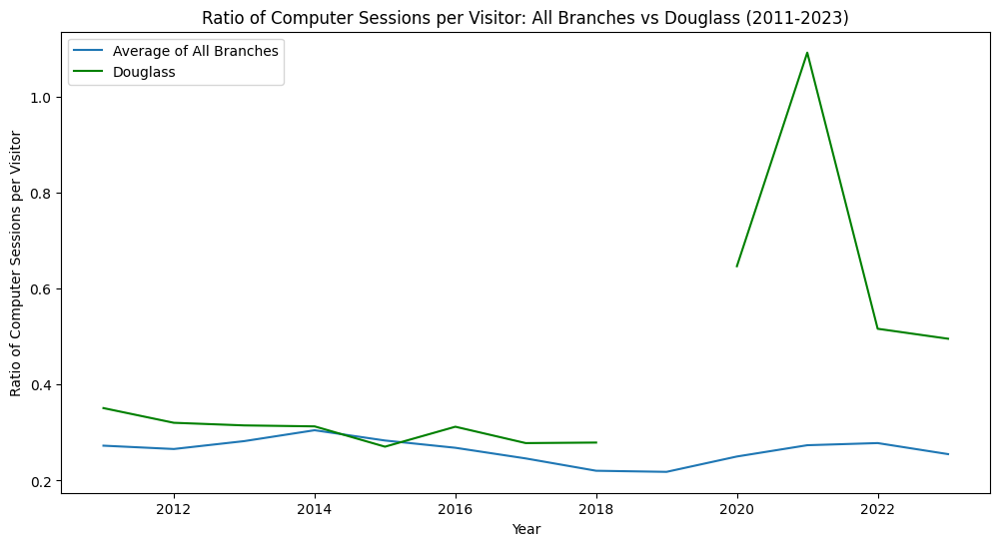

In [9]:
#Selected branch
branch_name = 'Douglass'

#Average of all 81 yearly average values
avg_all_branches = open_branches_cspv_yearly.mean(axis=0)
avg_all_branches

#Extracting specific branch
selected_branch = open_branches_cspv_yearly.loc[branch_name]

plt.figure(figsize=(12,6))
plt.plot(avg_all_branches, label='Average of All Branches')
plt.plot(selected_branch, label=branch_name, color='green')
plt.xlabel('Year')
plt.ylabel('Ratio of Computer Sessions per Visitor')
plt.title(f'Ratio of Computer Sessions per Visitor: All Branches vs {branch_name} (2011-2023)')
plt.legend()
plt.show()

*Note that the highest point in the line is roughly around 1.5

##### Examining the Douglass Dataframe

**Gap in graph:**

In [10]:
selected_branch # Douglass is NaN for 2019-- why?

YEAR
2011    0.350992
2012    0.320403
2013    0.314922
2014    0.312922
2015    0.270646
2016    0.312195
2017    0.278100
2018    0.279212
2019         NaN
2020    0.646408
2021    1.091171
2022    0.516173
2023    0.495422
Name: Douglass, dtype: float64

In [11]:
#Breaking down month by month for 2019
douglass_2019 = open_branches.loc[((open_branches['BRANCH']) == 'Douglass') & ((open_branches['YEAR'] == 2019))]
douglass_2019

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS


Since the open_branches dataset removes any values of 0, this must mean that for all of 2019, Visitors and Computer Sessions were 0. I can verify this by looking at the original set of clean data with open and closed branches, all_branches

In [12]:
#Taking the all_branches dataset and calling it something different to extract the specific rows for the Douglass branch in 2019
all_branches_douglass_2019 = all_branches.loc[3340:3351]
all_branches_douglass_2019

,BRANCH,YEAR,MONTH,CIRCULATION,COMPUTER_SESSIONS,VISITORS
3340,Douglass,2019,1,0.0,0.0,0.0
3341,Douglass,2019,2,0.0,0.0,0.0
3342,Douglass,2019,3,4.0,0.0,0.0
3343,Douglass,2019,4,0.0,0.0,0.0
3344,Douglass,2019,5,0.0,0.0,0.0
3345,Douglass,2019,6,0.0,0.0,0.0
3346,Douglass,2019,7,0.0,0.0,0.0
3347,Douglass,2019,8,0.0,0.0,0.0
3348,Douglass,2019,9,0.0,0.0,0.0
3349,Douglass,2019,10,2.0,0.0,0.0


**Conclusion:** This DataFrame comes from open_branches, which excludes any values of 0 in the Computer Session and Visitors columns. From 01-2019 to 12-2019, Douglass had at least 0 Computer Sessions or at least 0 Visitors. Thus, I assume the gap in the plot for Douglass is because the dataset excludes values of 0. 

The spike in this graph during 2021 could be explained with the same reasoning for the spike in the Altgeld graph. More computer sessions per visitor in 2021, in comparison to prior years.

Additionally, for this branch, it shows that the ratio of computer sessions per visitor are still higher in 2022-beyond (roughly around 0.5). The years prior to COVID were below 0.4. Are people needing access to computers in libraries now more than ever? Was COVID the reason for this? 

## Visualizing Above Data to our Bubblemap (monthly)

- Next, I imported our groups Bubblemap code and added in my own data focusing on the ratio of Computer Sessions per Visitor to be able to visualize those ratios on a map.
- But first, to import the Bubblemap, I must add in all of the code to produce that Bubblemap

### Code for generating Bubblemap (before adding in Computer Sessions per Visitor data)

In [5]:
#Import Packages
import pandas as pd
import numpy as np
import pandas as pd
import plotly.express as px

We need the locations of the library branches to be able to generate the Bubblemap, so I am importing the location data as well.

In [6]:
#Importing csv file for computing branch locations
branch_locations = pd.read_csv('../../data/clean/branch_metrics.csv')

The data used in our Bubblemap does not include any values of 0 for Computer Sessions and Visitors, so I will again be using open_branches. I will also copy this dataset and rename it and so it can be used seperately from the above work. (The names for my datasets are different than the Bubblemap code for the other group members)

In [8]:
#Getting sums of Circulation, Computer Sessions, and Visitors in each branch by year
yearlyBranchInfo = open_branches.groupby(['YEAR','BRANCH']).sum()
yearlyBranchInfo

MONTH  CIRCULATION  COMPUTER_SESSIONS  VISITORS
YEAR BRANCH                                                                
2011 Albany Park               78     120059.0            21966.0  117425.0
     Altgeld                   78       9611.0            31782.0   58657.0
     Archer Heights            78     101951.0            25321.0  124653.0
     Austin                    78      25527.0            33207.0  102306.0
     Austin-Irving             78     165634.0            35093.0  145852.0
...                           ...          ...                ...       ...
2023 West Pullman              10       3325.0             4629.0   23966.0
     West Town                 10      18885.0             4329.0   29180.0
     Whitney M. Young, Jr.     10       3068.0             6402.0   14232.0
     Woodson Regional          10       8480.0            12663.0   24108.0
     Wrightwood-Ashburn        10       3213.0             2701.0   24157.0

[1012 rows x 4 columns]

In [9]:
yearlyBranchInfo.to_csv('../../notebooks/CSV Compile for Library Info and Nbhs/yearlyBranchInfo.csv')

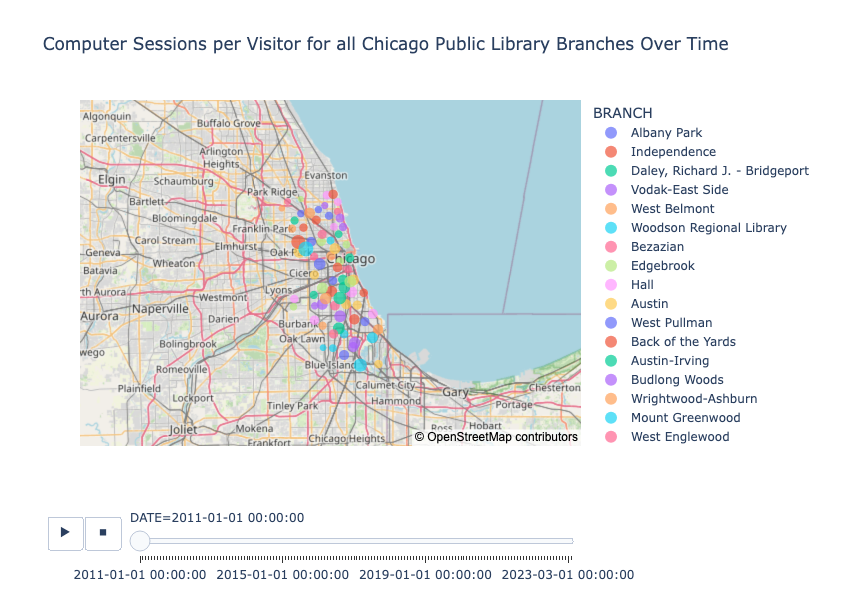

In [26]:
#Making a copy of open_branches dataset and renaming it
branchMetricsMod = open_branches.copy(deep=True)

#Creating a Date column that combines the Year and Month columns
branchMetricsMod['DATE'] = pd.to_datetime(branchMetricsMod[['YEAR', 'MONTH']].assign(DAY=1))

#Adding Computer Sessions per Visitor column by taking the ratio
branchMetricsMod['COMPUTER_SESSIONS_PER_VISITOR'] = (open_branches['COMPUTER_SESSIONS'] / open_branches['VISITORS'])

#Reorganzing data to group Date and Branch
metricsByDate = branchMetricsMod.groupby(['DATE','BRANCH']).sum()
#Resetting index
metricsByDate.reset_index(inplace = True)
#Adding in the Latitude and Longitude data from the branch_locations column by merging
metricsByDate = metricsByDate.merge(branch_locations)

#Taking out irrelevant columns
metricsByDate = metricsByDate[['DATE', 'BRANCH', 'CIRCULATION', 'COMPUTER_SESSIONS', 'COMPUTER_SESSIONS_PER_VISITOR', 'VISITORS', 'LOCATION']]

#Adding Latitude and Longitude columns back in
metricsByDate[['LATITUDE', 'LONGITUDE']] = [ast.literal_eval(x)[:2] for x in metricsByDate['LOCATION']]

#Dropping Location column
metricsByDate = metricsByDate.drop(columns='LOCATION')

#Sorting monthly dates 
metricsByDate = metricsByDate.sort_values(by='DATE', ascending=True)

#Defining our plot using the scatterMapBoxOverTime function and plotting lat, long, brach, cspv
figureExample = scatterMapBoxOverTime(metricsByDate,'LATITUDE','LONGITUDE','BRANCH','COMPUTER_SESSIONS_PER_VISITOR','DATE','Computer Sessions per Visitor for all Chicago Public Library Branches Over Time')
figureExample.show()

This Bubblemap gives a month by month timelapse of the average computer sessions per visitor for every branch from 2011-2023.

Looking at this timelapse, I was intrigued by some of the branches that had extremely large growths. For example, in 12-2022, at the bottom left, West Pullman (purple circle) experienced a large jump. So, I decided to create a new plot that compares West Pullmans ratio of Computer Sessions per visitor to the average of all the other branches' ratios.